In [1]:
# load up needed libraries
library(httr)
library(imager)

Loading required package: plyr
Loading required package: magrittr
Loading required package: stringr
Loading required package: png
Loading required package: jpeg

Attaching package: ‘imager’

The following object is masked from ‘package:magrittr’:

    add

The following object is masked from ‘package:plyr’:

    liply

The following objects are masked from ‘package:stats’:

    convolve, spectrum

The following object is masked from ‘package:graphics’:

    frame

The following object is masked from ‘package:base’:

    save.image



In [2]:
# build example in R first check that the GET request can still be made
# when running from jupyter notebook, sometimes there is a "vapply" that prints, but acutally 
# causes no error. Safe to ignore for now. 

library(httr)

api_key <- scan(file = "../NYTimesAPI.txt", what = character(0))

url <- "https://api.nytimes.com/svc/search/v2/articlesearch.json"

r <- GET(url, 
  query = list('api-key' = api_key, q = 'Olympics')
)

articles <- content(r)$response$docs # get the article meta data

articles

ERROR: Error in vapply(seq_along(mapped), function(i) {: values must be length 1,
 but FUN(X[[4]]) result is length 0


[[1]]
[[1]]$web_url
[1] "http://www.nytimes.com/2014/12/06/sports/olympics/a-defining-moment-for-the-olympic-games.html"

[[1]]$snippet
[1] "The International Olympic Committee will meet in special session next week in Monaco to vote on 40 proposals that address issues like Olympic bidding and white elephant venues...."

[[1]]$lead_paragraph
[1] "The International Olympic Committee will meet in special session next week in Monaco to vote on 40 proposals that address issues like Olympic bidding and white elephant venues."

[[1]]$abstract
NULL

[[1]]$print_page
[1] ""

[[1]]$blog
list()

[[1]]$source
[1] "The New York Times"

[[1]]$multimedia
[[1]]$multimedia[[1]]
[[1]]$multimedia[[1]]$subtype
[1] "wide"

[[1]]$multimedia[[1]]$url
[1] "images/2014/12/06/sports/06clarey1/06clarey1-thumbWide.jpg"

[[1]]$multimedia[[1]]$height
[1] 126

[[1]]$multimedia[[1]]$width
[1] 190

[[1]]$multimedia[[1]]$legacy
[[1]]$multimedia[[1]]$legacy$wide
[1] "images/2014/12/06/sports/06clarey1/06clarey1-thumbWi

In [3]:
# no need to convert from JSON as httr library takes care of this
# everything is converted into an R object, accessed via the $ command
articles[[1]]$lead_paragraph

[1] "The International Olympic Committee will meet in special session next week in Monaco to vote on 40 proposals that address issues like Olympic bidding and white elephant venues."

In [4]:
some_article <- articles[[1]]
some_article$lead_paragraph

[1] "The International Olympic Committee will meet in special session next week in Monaco to vote on 40 proposals that address issues like Olympic bidding and white elephant venues."

In [5]:
img_url <- paste('http://www.nytimes.com/', some_article$multimedia[[1]]$url, sep = "")  
img_url

[1] "http://www.nytimes.com/images/2014/12/06/sports/06clarey1/06clarey1-thumbWide.jpg"

[1] TRUE

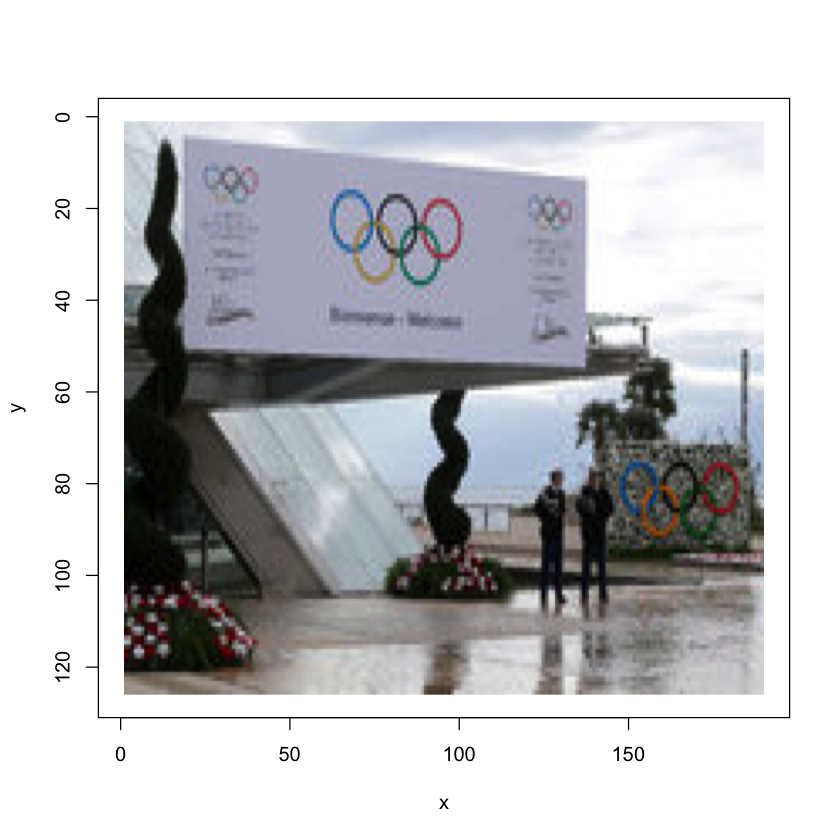

In [6]:
# showing this image in R requires a little bit more work, but is still not too bad
library(imager) # this is a nice library to use

# download the file temporarily
z <- tempfile()
download.file(img_url,z,mode="wb")
# load in using imager
img <- load.image(z)
file.remove(z) # cleanup temporary file

plot(img)

In [7]:
# now let's create an S4 object of the article
Article <- setClass("Article", slots=list(data='list',keys='character'))
#override the default initializer
setMethod(f="initialize",
         signature="Article",
         definition=function(.Object,data){
             .Object@data <- data # keep the data
             .Object@keys <- names(data)
             return(.Object)
         })

#create a new function and define it
setGeneric('getParam',
           def=function(object,
                        param='type_of_material'){standardGeneric('getParam')})

setMethod(f='getParam',signature='Article',
         definition=function(object,param){ 
             if(param %in% object@keys){
                 return(object@data[[param]])
             }
             else{
                 return(c(''))
             }
         })

[1] "initialize"

[1] "getParam"

[1] "getParam"

In [8]:
a <- Article(some_article)
getParam(a,'lead_paragraph')

[1] "The International Olympic Committee will meet in special session next week in Monaco to vote on 40 proposals that address issues like Olympic bidding and white elephant venues."

In [9]:
# now lets add functionality for the recursive indexing
setGeneric('getParamRecurse',
           def=function(object,param=list('type_of_material')){standardGeneric('getParamRecurse')})
setMethod(f='getParamRecurse',
         signature='Article',
         definition=function(object,param=list('type_of_material')){
             # define our own private recursion function to be used in this scope only
             recursion_<-function(data,rparam){
                 if( (length(rparam)>0) & (rparam[1] %in% names(data))){
                     # if we have more recursion to do
                     return(recursion_(data[[rparam[[1]]]],rparam[2:length(rparam)]))
                 }else if(is.character(data)){
                     # if data is no longer a list
                     return(data)
                 }else if(length(rparam)==1 & rparam[1] %in% names(data)){
                     # if there is only one parameter left
                     return(data[[rparam[[1]]]])
                 }else{
                     return(c(''))
                 }
             }
             
             return(recursion_(object@data,param))
         })

[1] "getParamRecurse"

[1] "getParamRecurse"

In [10]:
getParamRecurse(a,list('headline','main'))

[1] "A Defining Moment for the Olympic Games"

In [11]:
# now let's add our summary function
setGeneric('articleSummary',def=function(object){standardGeneric('articleSummary')})
setMethod(f='articleSummary',
         signature='Article',
         definition=function(object){
             
             for(elem in list(list('headline','main'),
                              list('headline','print_headline'),
                              'news_desk',
                              'section_name',
                              'subsection_name',
                              'snippet',
                              'lead_paragraph',
                              'abstract'))
                 {
                 print(getParamRecurse(object,elem))
             }
         })

[1] "articleSummary"

[1] "articleSummary"

In [12]:
for(a in articles){
    print('')
    print('========================')
    articleSummary(Article(a))
}

[1] ""
[1] "========================"
[1] "A Defining Moment for the Olympic Games"
[1] ""
[1] "Sports"
[1] "Sports"
[1] "Olympics"
[1] "The International Olympic Committee will meet in special session next week in Monaco to vote on 40 proposals that address issues like Olympic bidding and white elephant venues...."
[1] "The International Olympic Committee will meet in special session next week in Monaco to vote on 40 proposals that address issues like Olympic bidding and white elephant venues."
[1] ""
[1] ""
[1] "========================"
[1] "I.O.C. Formally Strips Jones of Five Medals From Sydney Games"
[1] "I.O.C. Strips Jones of Five Medals"
[1] "Sports"
[1] "Sports"
[1] "More Sports"
[1] "LAUSANNE, Switzerland (AP) &#151; The International Olympic Committee formally stripped Marion Jones of her five Olympic medals Wednesday, wiping her name from the record books after her admission that she was a drug cheat...."
[1] "LAUSANNE, Switzerland (AP) &#151; The International Olympic Com

In [13]:
# now let's create an S4 object for media types
NYMedia <- setClass("NYMedia", slots=list(media='list',image='cimg'))
setMethod(f="initialize",
         signature="NYMedia",
         definition=function(.Object,media){
             .Object@media <- media # keep the data
             
             img_url <- paste('http://www.nytimes.com/', .Object@media[['url']], sep = "")
             # download the file temporarily
             z <- tempfile()
             download.file(img_url,z,mode="wb")
             # load in using imager
             .Object@image <- load.image(z)
             file.remove(z) # cleanup temporary file
             return(.Object)
         })

setGeneric("getImage", def=function(object){standardGeneric("getImage")})
setMethod(f="getImage",
         signature="NYMedia",
         definition=function(object){
             
             return(object@image)
         })

Warning message:
: undefined slot classes in definition of "NYMedia": image(class "cimg")

[1] "initialize"

[1] "getImage"

[1] "getImage"

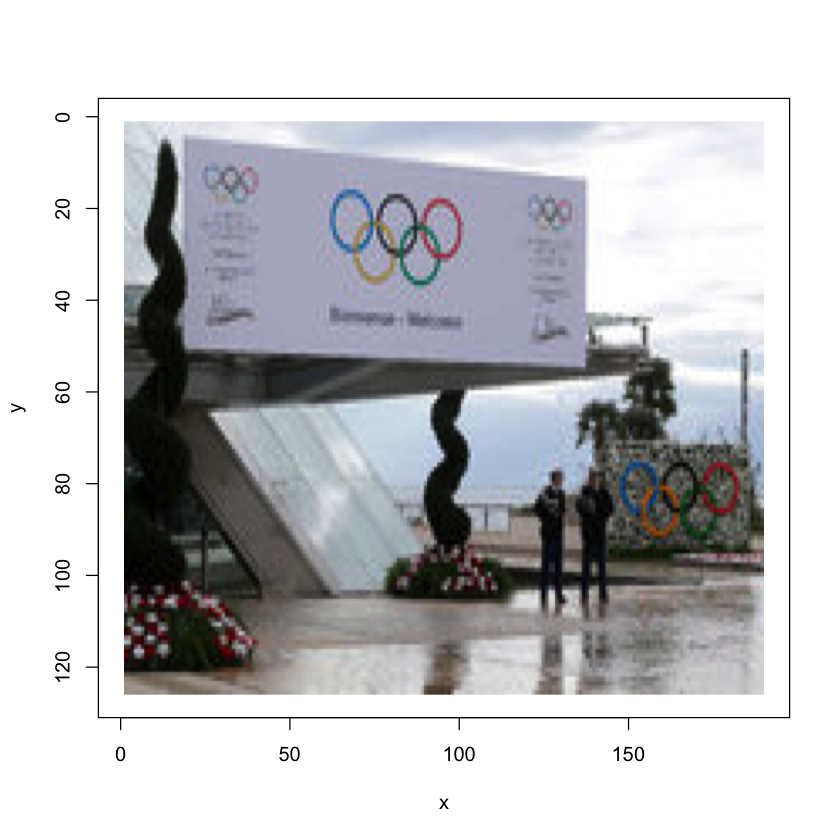

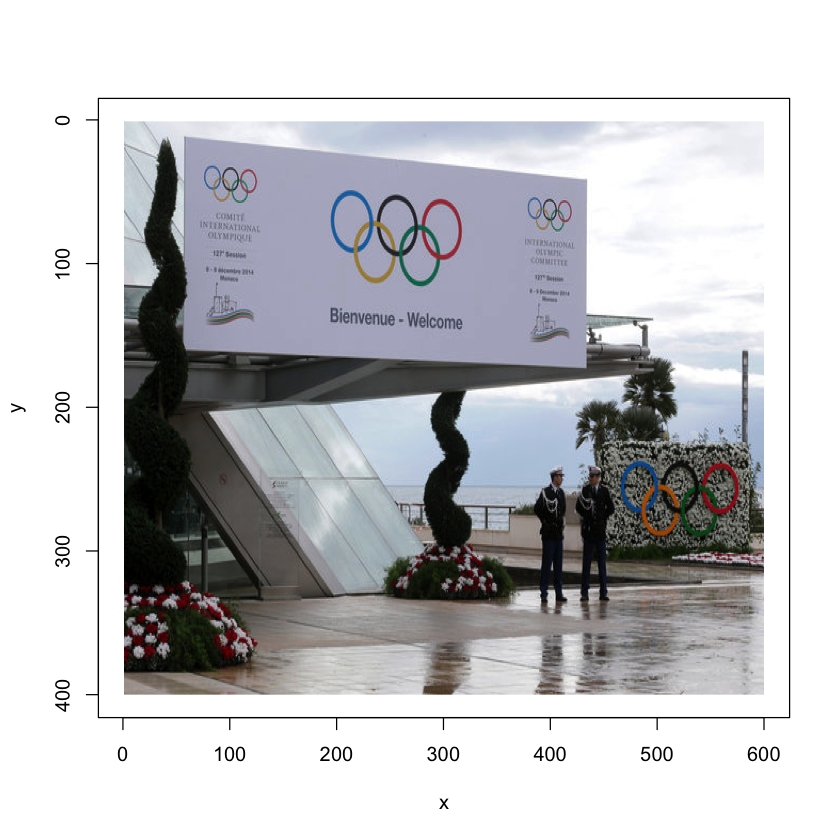

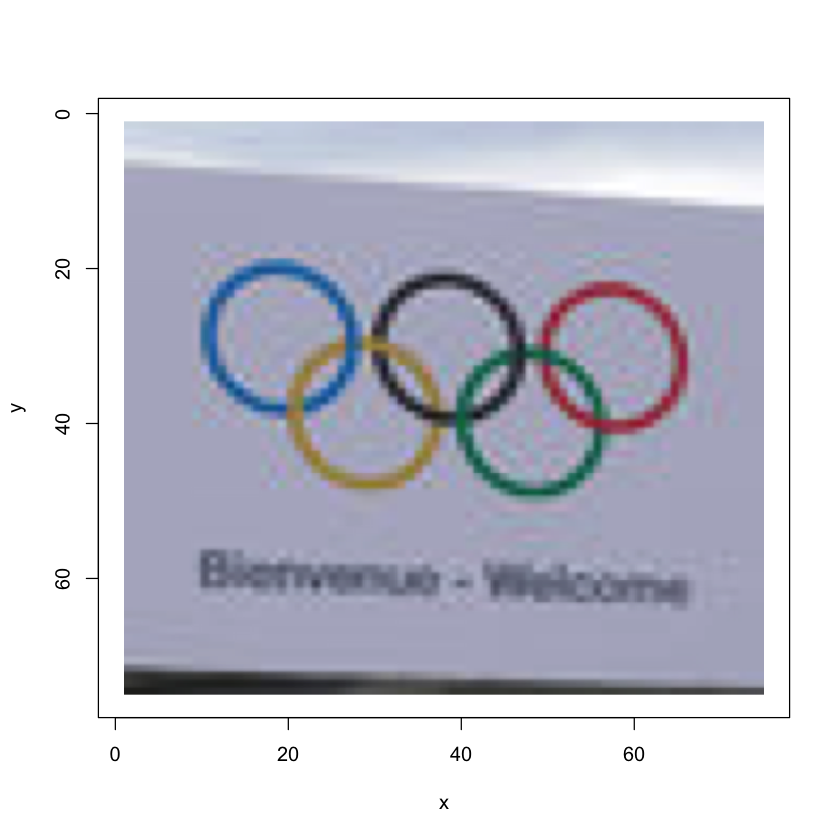

In [14]:
for(m in some_article$multimedia){
    media = NYMedia(m)
    plot(getImage(media))
}

In [15]:
# now we want to show the images for R
# in python we would inherit the functionality
# in R we can do the same thing, as shown

# now let's create an S4 object of the article
ArticleWithMedia <- setClass("ArticleWithMedia", 
                             slots=list(data='list',keys='character',media='list'),
                             contains="Article")
#override the default initializer
setMethod(f="initialize",
         signature="ArticleWithMedia",
         definition=function(.Object,data){
             N = length(data$multimedia)
             if(N>0){
                     .Object@media <- vector("list", length(data$multimedia))
                     for(i in 1:length(data$multimedia)){
                         .Object@media[i] <- NYMedia(data$multimedia[[i]])
                     }
                 }
             
             # now call the inherited initializer for the class
             callNextMethod(.Object,data)
         })

a <- ArticleWithMedia(some_article)

[1] "initialize"

[1] "showImages"

[1] "showImages"

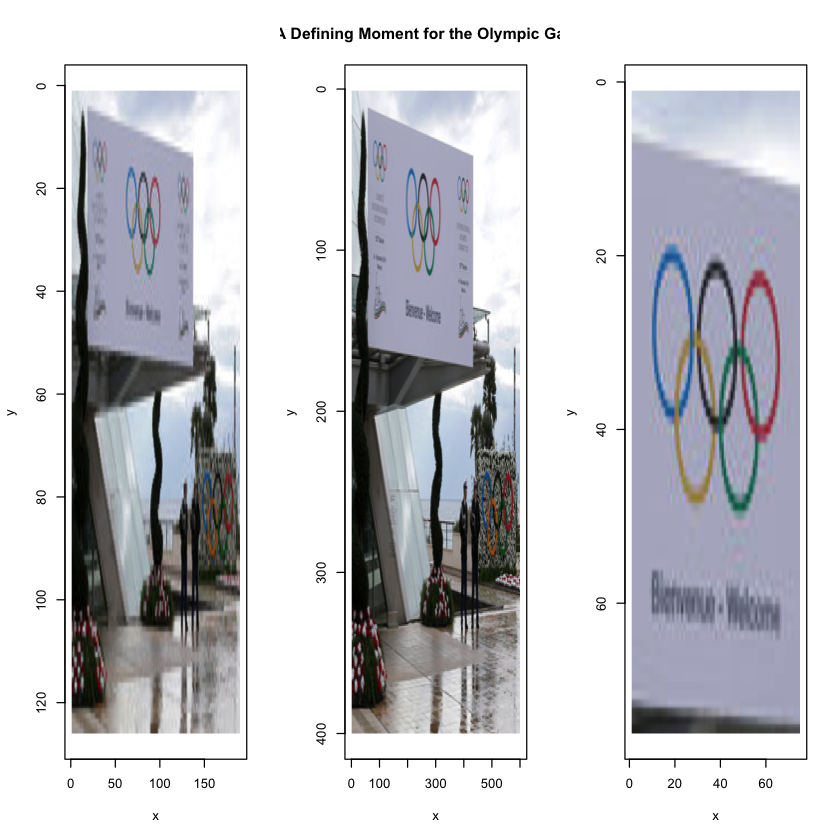

In [16]:
setGeneric("showImages",def=function(object){standardGeneric("showImages")})
setMethod(f="showImages",
         signature="ArticleWithMedia",
         definition=function(object){
             layout(t(1:length(object@media)))
             
             title <- getParamRecurse(object,list('headline','main'))
             for(i in seq_along(object@media)){
                 if(i==2){
                     # add a title
                     getImage(object@media[[i]]) %>% plot(main=title)
                 }else{
                     # no title
                     plot(getImage(object@media[[i]]))
                 }
                 
             }
         })

a <- ArticleWithMedia(some_article)
showImages(a)


[1] "showImages"

[1] "showImages"

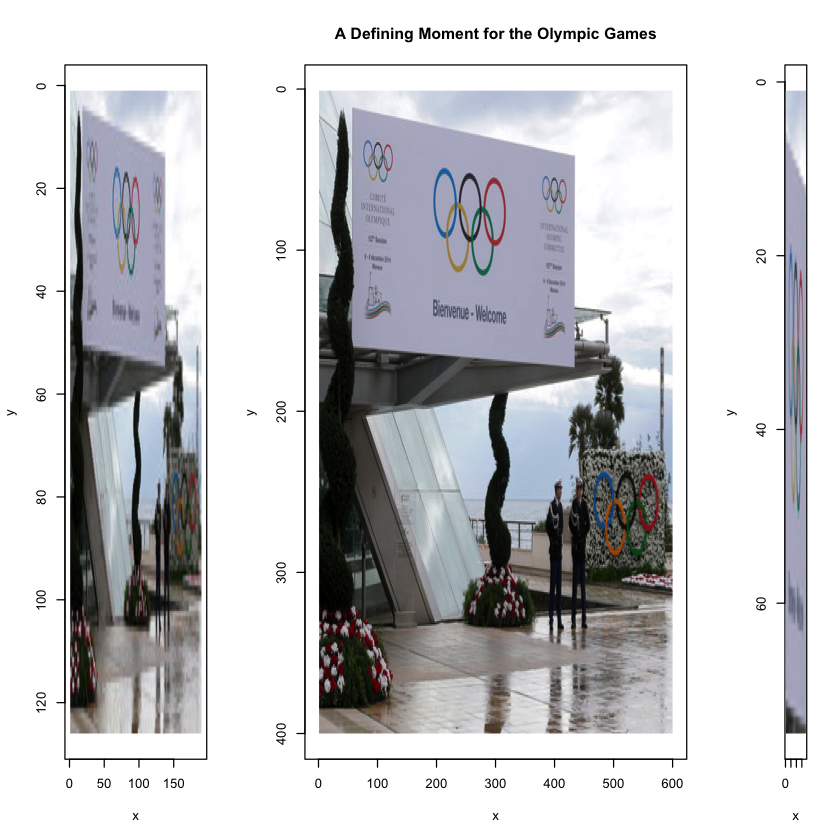

In [17]:
# the plotting here leaves much to be desired, so let's fix it a bit.

setGeneric("showImages",def=function(object){standardGeneric("showImages")})
setMethod(f="showImages",
         signature="ArticleWithMedia",
         definition=function(object){
             
             N <- length(object@media)
             layout(t(1:N), widths=c(2,4,1))
             
             title <- getParamRecurse(object,list('headline','main'))
             for(i in seq_along(object@media)){
                 if(i==2){
                     # add a title
                     getImage(object@media[[i]]) %>% plot(main=title)
                 }else{
                     # no title
                     plot(getImage(object@media[[i]]))
                 }
                 
             }
         })

a <- ArticleWithMedia(some_article)
showImages(a)



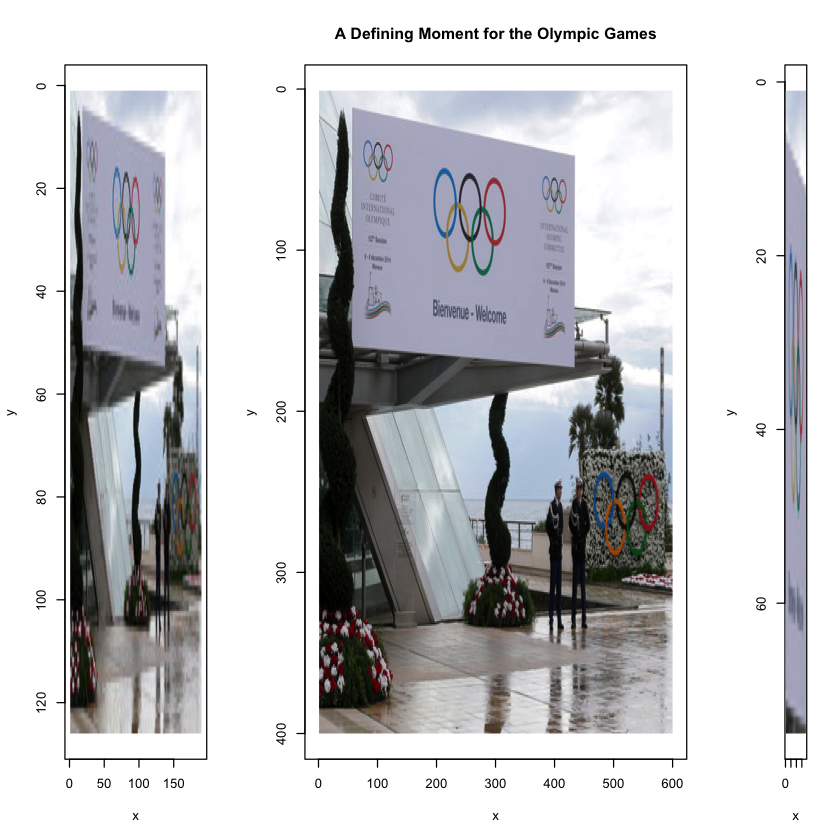

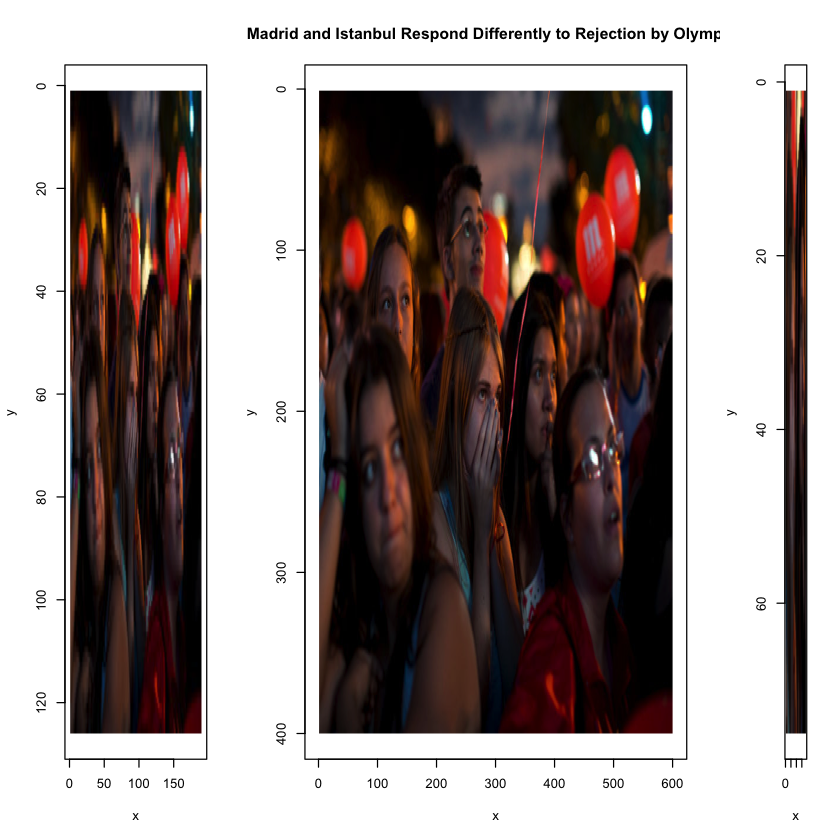

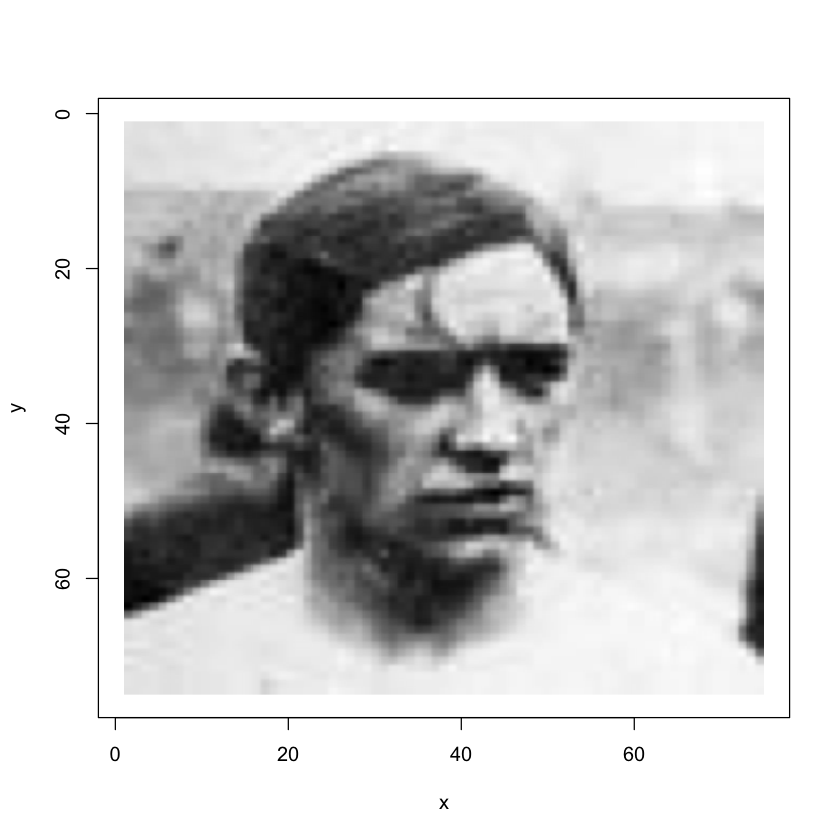

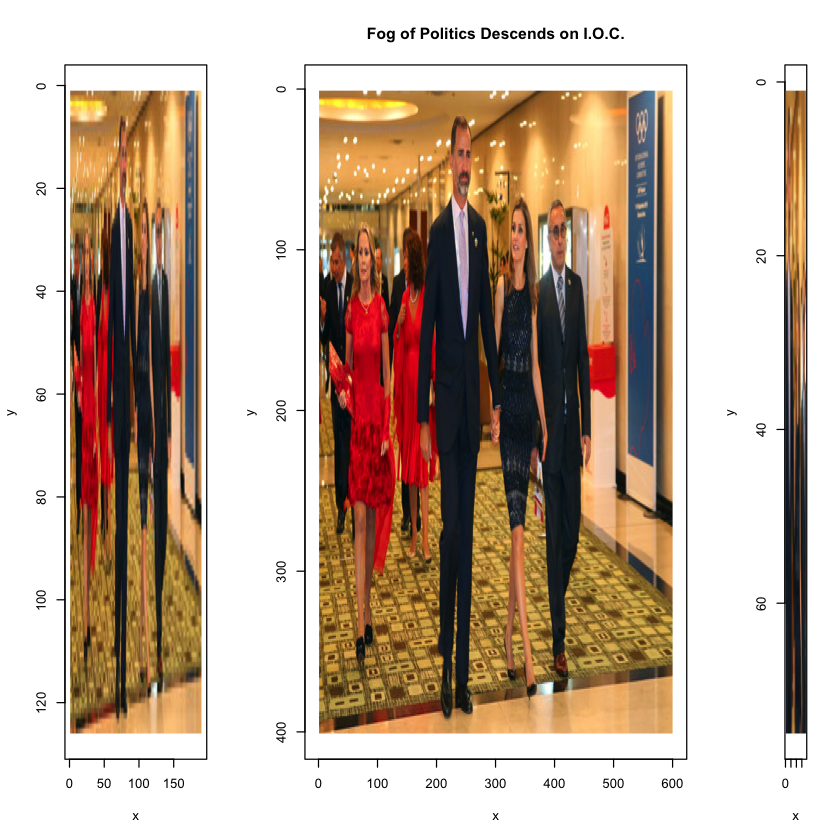

In [18]:
# do it for all the images
articles_vect <- vector('list',length(articles))
for(i in 1:length(articles)){
    articles_vect[i] <- ArticleWithMedia(articles[[i]])
}

for(a in articles_vect){
        showImages(a)
}

There is sitll much to be desired from this, perhaps a better implementation would use the heights and widths of the images and the `par` command to fix things, but I will leave that to you. (I have already started the finding of the widths and heights, if you want to add to it:

`
N <- length(object@media)
widths <- vector('list',N)
hghts <-  vector('list',N)
for(i in seq_along(object@media)){
     widths[[i]] <- width(getImage(object@media[[i]]))
     hghts[[i]] <- height(getImage(object@media[[i]]))
}
`

Then take a look here at the advanced layour options: http://www.statmethods.net/advgraphs/layout.html